In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

from astropy.table import Table
import astropy.units as u
import astropy.constants as c

import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams["font.size"] = 20
rcParams['figure.dpi'] = 100
rcParams["savefig.dpi"] = 300
rcParams["savefig.bbox"] = 'tight'

import numpy as np
import pandas as pd
import pickle

import os
import requests
from io import BytesIO
from io import StringIO

from astropy.table import Table
from astropy.table import join
from astropy.io import ascii
import astropy.constants as c

from scipy import interpolate
from scipy import stats
#from sklearn import svm

#Suppressing astropy units warnings
import warnings
from astropy.utils.exceptions import AstropyWarning

warnings.filterwarnings('ignore', category=UserWarning, append=True)
warnings.simplefilter('ignore', category=AstropyWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

#Suppressing Pandas chained assignment warnings
pd.options.mode.chained_assignment = None  # default='warn'


#Set the plotting style
import seaborn as sns

sns.set(style="ticks", 
        context="paper",
        font_scale=1,
        palette=sns.color_palette("coolwarm"))

sc_kws = {"cmap": "viridis", 
          "s": 10, 
          "rasterized":True, 
          "lw": 0.25, 
          "alpha": 0.25}

### This notebook models isochronal age estimates as a linear combination of the abundances published in Brewer & Fischer 2018. The first model uses abundances normalized to hydrogen, while the second model normalizes abundances to iron.

### Read in the data file

In [2]:
df = pd.read_parquet("../data/data.parquet")
df.head()

,kepid,kepoi_name,kepler_name,ra,ra_err,ra_str,dec,dec_err,dec_str,koi_gmag,...,bf18_e_[Na/N],bf18_[Na/C],bf18_e_[Na/C],bf18_[O/N],bf18_e_[O/N],bf18_[O/C],bf18_e_[O/C],bf18_[N/C],bf18_e_[N/C],bf18_[alpha/Fe]
0,10797460,K00752.01,Kepler-227 b,291.93423,0.0,19h27m44.22s,48.141651,0.0,+48d08m29.9s,15.890,...,0.155563,-0.04,0.056569,0.1,0.155563,0.08,0.056569,-0.02,0.056569,-0.01
1,10797460,K00752.02,Kepler-227 c,291.93423,0.0,19h27m44.22s,48.141651,0.0,+48d08m29.9s,15.890,...,0.155563,-0.04,0.056569,0.1,0.155563,0.08,0.056569,-0.02,0.056569,-0.01
2,10811496,K00753.01,None,297.00482,0.0,19h48m01.16s,48.134129,0.0,+48d08m02.9s,15.943,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10848459,K00754.01,None,285.53461,0.0,19h02m08.31s,48.285210,0.0,+48d17m06.8s,16.100,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10854555,K00755.01,Kepler-664 b,288.75488,0.0,19h15m01.17s,48.226200,0.0,+48d13m34.3s,16.015,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
for col in df.columns:
    if "/H]" in col:
        print(col)

b18_[Fe/H]
b18_tb2_[Fe/H]
cks_[Fe/H]
cks_E_[Fe/H]
cks_e_[Fe/H]
bf18_[M/H]
bf18_[C/H]
bf18_[N/H]
bf18_[O/H]
bf18_[Na/H]
bf18_[Mg/H]
bf18_[Al/H]
bf18_[Si/H]
bf18_[Ca/H]
bf18_[Ti/H]
bf18_[V/H]
bf18_[Cr/H]
bf18_[Mn/H]
bf18_[Fe/H]
bf18_[Ni/H]
bf18_[Y/H]
bf18_e_[M/H]
bf18_e_[C/H]
bf18_e_[N/H]
bf18_e_[O/H]
bf18_e_[Na/H]
bf18_e_[Mg/H]
bf18_e_[Al/H]
bf18_e_[Si/H]
bf18_e_[Ca/H]
bf18_e_[Ti/H]
bf18_e_[V/H]
bf18_e_[Cr/H]
bf18_e_[Mn/H]
bf18_e_[Fe/H]
bf18_e_[Ni/H]
bf18_e_[Y/H]
s15_[Fe/H]
s15_e_[Fe/H]


# Multivariate linear model: age = age([X/H])

In [4]:
import pymc3 as pm
import pymc3_ext as pmx
import aesara_theano_fallback.tensor as tt
import exoplanet as xo

print(pm.__version__)
print(xo.__version__)


n20_sun_like = (df['p20_cks_steff']>5600)&(df['p20_cks_steff']<5950)&\
               (df['p20_cks_slogg']>4.2)&(df['p20_cks_slogg']<4.53)&\
               (df['p20_cks_smet']>-0.3)&(df['p20_cks_smet']<0.3)


m = (np.isfinite(df["cks_age"])) & (np.isfinite(df["bf18_[Fe/H]"])) & (abs(df["bf18_[N/H]"])<5)


age, ageerr = df["cks_age"][m], df["cks_age_maxerr"][m]
el01, el01err = df["bf18_[C/H]"][m], df["bf18_e_[C/H]"][m]
el02, el02err = df["bf18_[N/H]"][m], df["bf18_e_[N/H]"][m]
el03, el03err = df["bf18_[O/H]"][m], df["bf18_e_[O/H]"][m]
el04, el04err = df["bf18_[Na/H]"][m], df["bf18_e_[Na/H]"][m]
el05, el05err = df["bf18_[Mg/H]"][m], df["bf18_e_[Mg/H]"][m]
el06, el06err = df["bf18_[Al/H]"][m], df["bf18_e_[Al/H]"][m]
el07, el07err = df["bf18_[Si/H]"][m], df["bf18_e_[Si/H]"][m]
el08, el08err = df["bf18_[Ca/H]"][m], df["bf18_e_[Ca/H]"][m]
el09, el09err = df["bf18_[Ti/H]"][m], df["bf18_e_[Ti/H]"][m]
el10, el10err = df["bf18_[V/H]"][m], df["bf18_e_[V/H]"][m]
el11, el11err = df["bf18_[Cr/H]"][m], df["bf18_e_[Cr/H]"][m]
el12, el12err = df["bf18_[Mn/H]"][m], df["bf18_e_[Mn/H]"][m]
el13, el13err = df["bf18_[Fe/H]"][m], df["bf18_e_[Fe/H]"][m]
el14, el14err = df["bf18_[Ni/H]"][m], df["bf18_e_[Ni/H]"][m]
el15, el15err = df["bf18_[Y/H]"][m], df["bf18_e_[Y/H]"][m]


with pm.Model() as model:  # model specifications in PyMC3 are wrapped in a with-statement
    
    # Define priors
    c0 = pm.Normal("c0", mu=0, sigma=100, testval=0)
    c1 = pm.Normal("c1", mu=0, sigma=100, testval=0)
    c2 = pm.Normal("c2", mu=0, sigma=100, testval=0)
    c3 = pm.Normal("c3", mu=0, sigma=100, testval=0)
    c4 = pm.Normal("c4", mu=0, sigma=100, testval=0)
    c5 = pm.Normal("c5", mu=0, sigma=100, testval=0)
    
    c6 = pm.Normal("c6", mu=0, sigma=100, testval=0)
    c7 = pm.Normal("c7", mu=0, sigma=100, testval=0)
    c8 = pm.Normal("c8", mu=0, sigma=100, testval=0)
    c9 = pm.Normal("c9", mu=0, sigma=100, testval=0)
    c10 = pm.Normal("c10", mu=0, sigma=100, testval=0)
    
    c11 = pm.Normal("c11", mu=0, sigma=100, testval=0)
    c12 = pm.Normal("c12", mu=0, sigma=100, testval=0)
    c13 = pm.Normal("c13", mu=0, sigma=100, testval=0)
    c14 = pm.Normal("c14", mu=0, sigma=100, testval=0)
    c15 = pm.Normal("c15", mu=0, sigma=100, testval=0)    
    
    # Define the model
    age_model = pm.Deterministic("age_model", 
                             c0 +
                             c1*el01 +
                             c2*el02 +
                             c3*el03 +
                             c4*el04 +
                             c5*el05 +
                             c6*el06 +
                             c7*el07 +
                             c8*el08 +
                             c9*el09 +
                             c10*el10 +
                             c11*el11 +
                             c12*el12 +
                             c13*el13 +
                             c14*el14 +
                             c15*el15)

    
    # Jitter for age errors
    age_sigma_jit = pm.HalfCauchy("age_sigma_jit", beta=10, testval=1.0)
    age_sigma = pm.Deterministic("age_sigma", ((age_sigma_jit**2 + ageerr**2)**0.5))
    
    # Define likelihood
    likelihood = pm.Normal("y", mu=age_model, 
                                sigma=age_sigma, 
                                observed=age) 
    
        
    
    #if start is None:
    start = model.test_point     
    map_soln = pmx.optimize(start=start)
    map_soln = pmx.optimize(start=map_soln)

3.11.4
0.5.1


optimizing logp for variables: [age_sigma_jit, c15, c14, c13, c12, c11, c10, c9, c8, c7, c6, c5, c4, c3, c2, c1, c0]


message: Optimization terminated successfully.
logp: -13469.427144951083 -> -3441.814405127487
optimizing logp for variables: [age_sigma_jit, c15, c14, c13, c12, c11, c10, c9, c8, c7, c6, c5, c4, c3, c2, c1, c0]


message: Optimization terminated successfully.
logp: -3441.814405127487 -> -3441.814405127487


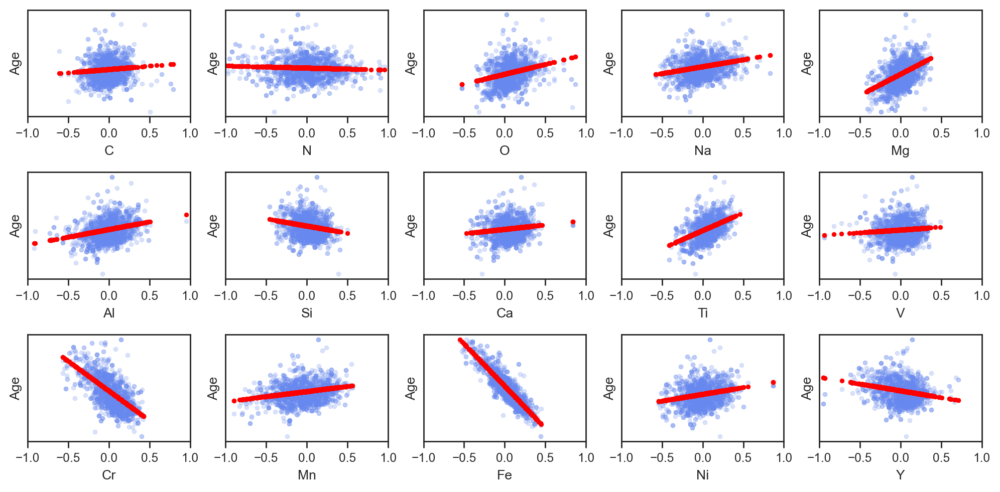

In [6]:
elems = ["C","N","O","Na","Mg","Al","Si","Ca","Ti","V","Cr","Mn","Fe","Ni","Y"]


fig,ax = plt.subplots(nrows=3,ncols=5,figsize=(10,5))


for i,el in enumerate(elems):
    
    if i<=4:
        ax[0][i%5].scatter(df["bf18_["+el+"/H]"][m], age - (map_soln["age_model"]-map_soln["c0"]-map_soln["c"+str(i+1)]*df["bf18_["+el+"/H]"][m]), **sc_kws)
        ax[0][i%5].set_xlabel(el)
        ax[0][i%5].set_xlim(-1,1)
        ax[0][i%5].set_yticks([]); ax[0][i%5].set_ylabel("Age")
        ax[0][i%5].plot(df["bf18_["+el+"/H]"][m], (map_soln["c0"] + map_soln["c"+str(i+1)]*df["bf18_["+el+"/H]"][m]), 'r.')

    elif (i>4) & (i<=9):
        ax[1][i%5].scatter(df["bf18_["+el+"/H]"][m], age - (map_soln["age_model"]-map_soln["c0"]-map_soln["c"+str(i+1)]*df["bf18_["+el+"/H]"][m]), **sc_kws)
        ax[1][i%5].set_xlabel(el)
        ax[1][i%5].set_xlim(-1,1)
        ax[1][i%5].set_yticks([]); ax[1][i%5].set_ylabel("Age")
        ax[1][i%5].plot(df["bf18_["+el+"/H]"][m], (map_soln["c0"] + map_soln["c"+str(i+1)]*df["bf18_["+el+"/H]"][m]), 'r.')
    elif (i>9):
        ax[2][i%5].scatter(df["bf18_["+el+"/H]"][m], age - (map_soln["age_model"]-map_soln["c0"]-map_soln["c"+str(i+1)]*df["bf18_["+el+"/H]"][m]), **sc_kws)
        ax[2][i%5].set_xlabel(el)
        ax[2][i%5].set_xlim(-1,1)
        ax[2][i%5].set_yticks([]); ax[2][i%5].set_ylabel("Age")
        ax[2][i%5].plot(df["bf18_["+el+"/H]"][m], (map_soln["c0"] + map_soln["c"+str(i+1)]*df["bf18_["+el+"/H]"][m]), 'r.')
        
    
    
plt.tight_layout()

In [7]:
np.random.seed(42)
with model:
    trace = pmx.sample(
        tune=1000,
        draws=1000,
        start=map_soln,
        cores=2,
        chains=2,
        target_accept=0.9,
        return_inferencedata=True,
    )

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [age_sigma_jit, c15, c14, c13, c12, c11, c10, c9, c8, c7, c6, c5, c4, c3, c2, c1, c0]


/Users/tdavid/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:624: RuntimeWarning: overflow encountered in _beta_ppf
  return _boost._beta_ppf(q, a, b)
/Users/tdavid/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:624: RuntimeWarning: overflow encountered in _beta_ppf
  return _boost._beta_ppf(q, a, b)
Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 38 seconds.


In [8]:
import arviz as az
var_names = ["c"+str(i) for i in range(16)]
az.summary(trace, var_names=var_names)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
c0,5.612,0.113,5.408,5.827,0.002,0.001,4267.0,1636.0,1.0
c1,1.305,1.003,-0.525,3.239,0.016,0.015,4038.0,1607.0,1.0
c2,-0.425,0.191,-0.808,-0.094,0.003,0.002,3693.0,1691.0,1.0
c3,3.657,0.655,2.385,4.810,0.011,0.008,3350.0,1699.0,1.0
c4,2.923,0.934,1.179,4.646,0.015,0.011,3851.0,1744.0,1.0
c5,8.175,2.156,4.284,12.148,0.036,0.026,3583.0,1584.0,1.0
c6,3.244,0.465,2.370,4.076,0.007,0.005,4046.0,1667.0,1.0
c7,-3.079,1.473,-6.006,-0.486,0.025,0.019,3594.0,1581.0,1.0
c8,1.924,1.522,-0.839,4.900,0.026,0.025,3349.0,1434.0,1.0
c9,8.180,1.520,5.222,10.843,0.023,0.016,4568.0,1793.0,1.0


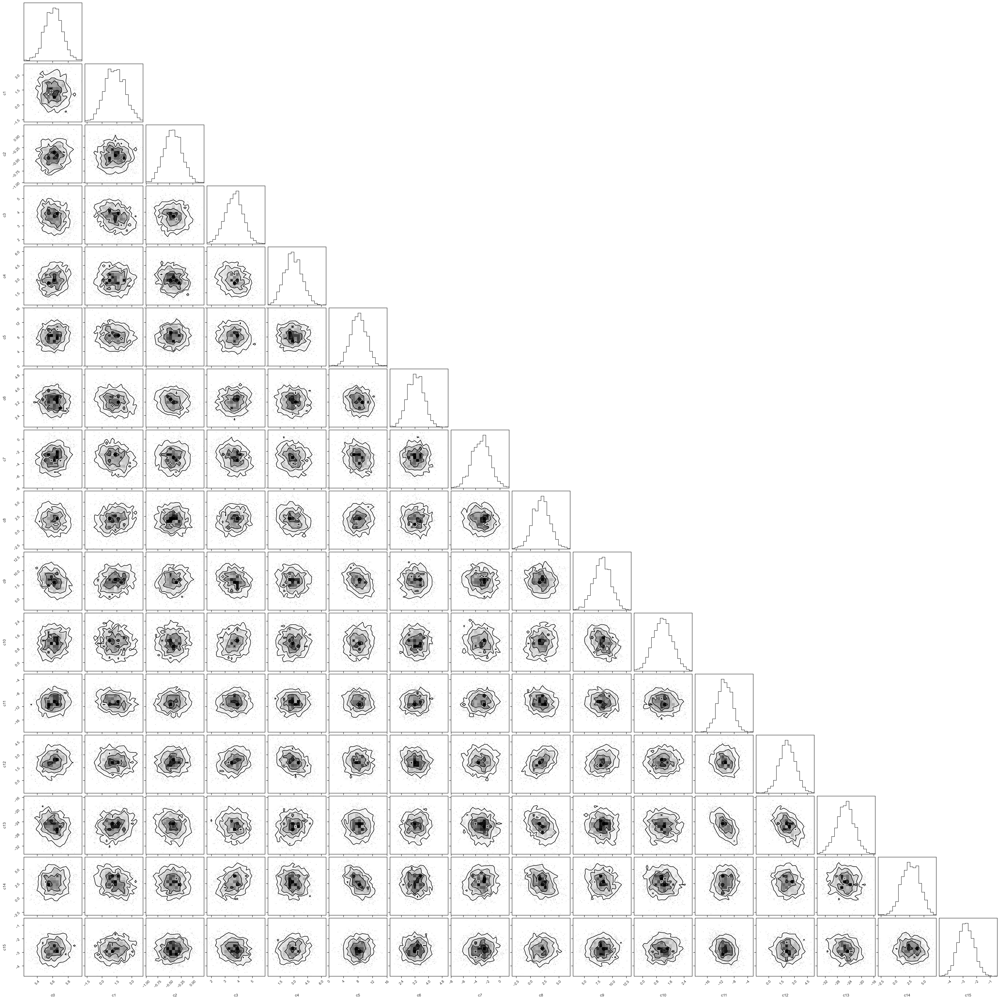

In [9]:
import corner

var_names = ["c"+str(i) for i in range(16)]

_ = corner.corner(
    trace,
    var_names=var_names,
)

# Multivariate linear model: age = age([X/Fe])

In [10]:
import pymc3 as pm
import pymc3_ext as pmx
import aesara_theano_fallback.tensor as tt
import exoplanet as xo

print(pm.__version__)
print(xo.__version__)


n20_sun_like = (df['p20_cks_steff']>5600)&(df['p20_cks_steff']<5950)&\
               (df['p20_cks_slogg']>4.2)&(df['p20_cks_slogg']<4.53)&\
               (df['p20_cks_smet']>-0.3)&(df['p20_cks_smet']<0.3)


m = (np.isfinite(df["cks_age"])) & (np.isfinite(df["bf18_[Fe/H]"])) & (abs(df["bf18_[N/H]"])<5)


age, ageerr = df["cks_age"][m], df["cks_age_maxerr"][m]
el01, el01err = df["bf18_[C/Fe]"][m], df["bf18_e_[C/Fe]"][m]
el02, el02err = df["bf18_[N/Fe]"][m], df["bf18_e_[N/Fe]"][m]
el03, el03err = df["bf18_[O/Fe]"][m], df["bf18_e_[O/Fe]"][m]
el04, el04err = df["bf18_[Na/Fe]"][m], df["bf18_e_[Na/Fe]"][m]
el05, el05err = df["bf18_[Mg/Fe]"][m], df["bf18_e_[Mg/Fe]"][m]
el06, el06err = df["bf18_[Al/Fe]"][m], df["bf18_e_[Al/Fe]"][m]
el07, el07err = df["bf18_[Si/Fe]"][m], df["bf18_e_[Si/Fe]"][m]
el08, el08err = df["bf18_[Ca/Fe]"][m], df["bf18_e_[Ca/Fe]"][m]
el09, el09err = df["bf18_[Ti/Fe]"][m], df["bf18_e_[Ti/Fe]"][m]
el10, el10err = df["bf18_[V/Fe]"][m], df["bf18_e_[V/Fe]"][m]
el11, el11err = df["bf18_[Cr/Fe]"][m], df["bf18_e_[Cr/Fe]"][m]
el12, el12err = df["bf18_[Mn/Fe]"][m], df["bf18_e_[Mn/Fe]"][m]
el13, el13err = df["bf18_[Ni/Fe]"][m], df["bf18_e_[Ni/Fe]"][m]
el14, el14err = df["bf18_[Y/Fe]"][m], df["bf18_e_[Y/Fe]"][m]


with pm.Model() as model:  # model specifications in PyMC3 are wrapped in a with-statement
    
    # Define priors
    c0 = pm.Normal("c0", mu=0, sigma=100, testval=0)
    c1 = pm.Normal("c1", mu=0, sigma=100, testval=0)
    c2 = pm.Normal("c2", mu=0, sigma=100, testval=0)
    c3 = pm.Normal("c3", mu=0, sigma=100, testval=0)
    c4 = pm.Normal("c4", mu=0, sigma=100, testval=0)
    c5 = pm.Normal("c5", mu=0, sigma=100, testval=0)
    
    c6 = pm.Normal("c6", mu=0, sigma=100, testval=0)
    c7 = pm.Normal("c7", mu=0, sigma=100, testval=0)
    c8 = pm.Normal("c8", mu=0, sigma=100, testval=0)
    c9 = pm.Normal("c9", mu=0, sigma=100, testval=0)
    c10 = pm.Normal("c10", mu=0, sigma=100, testval=0)
    
    c11 = pm.Normal("c11", mu=0, sigma=100, testval=0)
    c12 = pm.Normal("c12", mu=0, sigma=100, testval=0)
    c13 = pm.Normal("c13", mu=0, sigma=100, testval=0)
    c14 = pm.Normal("c14", mu=0, sigma=100, testval=0)
    c15 = pm.Normal("c15", mu=0, sigma=100, testval=0)    
    
    # Define the model
    age_model = pm.Deterministic("age_model", 
                             c0 +
                             c1*el01 +
                             c2*el02 +
                             c3*el03 +
                             c4*el04 +
                             c5*el05 +
                             c6*el06 +
                             c7*el07 +
                             c8*el08 +
                             c9*el09 +
                             c10*el10 +
                             c11*el11 +
                             c12*el12 +
                             c13*el13 +
                             c14*el14)

    
    # Jitter for age errors
    age_sigma_jit = pm.HalfCauchy("age_sigma_jit", beta=10, testval=1.0)
    age_sigma = pm.Deterministic("age_sigma", ((age_sigma_jit**2 + ageerr**2)**0.5))
    
    # Define likelihood
    likelihood = pm.Normal("y", mu=age_model, 
                                sigma=age_sigma, 
                                observed=age) 
    
        
    
    #if start is None:
    start = model.test_point     
    map_soln = pmx.optimize(start=start)
    map_soln = pmx.optimize(start=map_soln)

3.11.4
0.5.1


optimizing logp for variables: [age_sigma_jit, c15, c14, c13, c12, c11, c10, c9, c8, c7, c6, c5, c4, c3, c2, c1, c0]


message: Optimization terminated successfully.
logp: -13469.427144951083 -> -3490.3716080985882
optimizing logp for variables: [age_sigma_jit, c15, c14, c13, c12, c11, c10, c9, c8, c7, c6, c5, c4, c3, c2, c1, c0]


message: Optimization terminated successfully.
logp: -3490.3716080985882 -> -3490.3716080985882


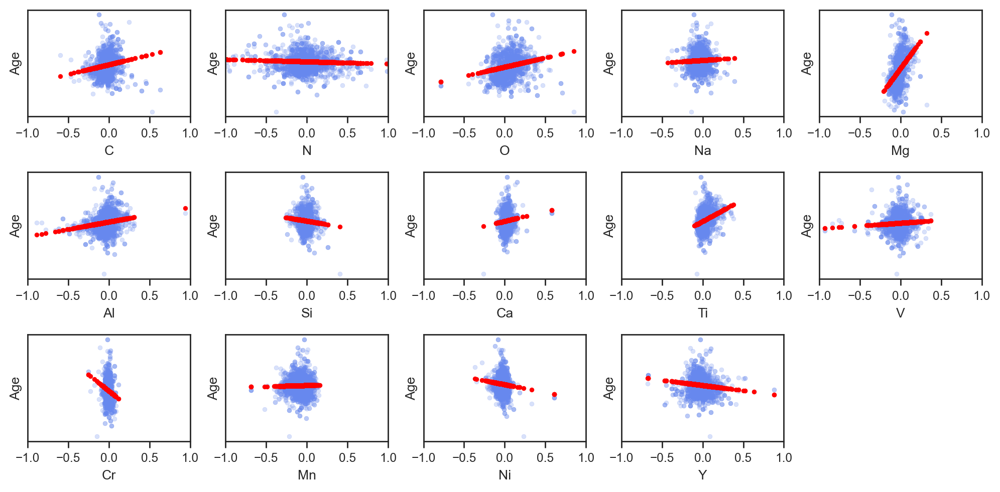

In [11]:
elems = ["C","N","O","Na","Mg","Al","Si","Ca","Ti","V","Cr","Mn","Ni","Y"]


fig,ax = plt.subplots(nrows=3,ncols=5,figsize=(10,5))


for i,el in enumerate(elems):
    
    if i<=4:
        ax[0][i%5].scatter(df["bf18_["+el+"/Fe]"][m], age - (map_soln["age_model"]-map_soln["c0"]-map_soln["c"+str(i+1)]*df["bf18_["+el+"/Fe]"][m]), **sc_kws)
        ax[0][i%5].set_xlabel(el)
        ax[0][i%5].set_xlim(-1,1)
        ax[0][i%5].set_yticks([]); ax[0][i%5].set_ylabel("Age")
        ax[0][i%5].plot(df["bf18_["+el+"/Fe]"][m], (map_soln["c0"] + map_soln["c"+str(i+1)]*df["bf18_["+el+"/Fe]"][m]), 'r.')
        #ax[0][i%5].plot(map_soln["c"+str(i+1)]*age, age, 'r.')
    elif (i>4) & (i<=9):
        ax[1][i%5].scatter(df["bf18_["+el+"/Fe]"][m], age - (map_soln["age_model"]-map_soln["c0"]-map_soln["c"+str(i+1)]*df["bf18_["+el+"/Fe]"][m]), **sc_kws)
        ax[1][i%5].set_xlabel(el)
        ax[1][i%5].set_xlim(-1,1)
        ax[1][i%5].set_yticks([]); ax[1][i%5].set_ylabel("Age")
        ax[1][i%5].plot(df["bf18_["+el+"/Fe]"][m], (map_soln["c0"] + map_soln["c"+str(i+1)]*df["bf18_["+el+"/Fe]"][m]), 'r.')
    elif (i>9):
        ax[2][i%5].scatter(df["bf18_["+el+"/Fe]"][m], age - (map_soln["age_model"]-map_soln["c0"]-map_soln["c"+str(i+1)]*df["bf18_["+el+"/Fe]"][m]), **sc_kws)
        ax[2][i%5].set_xlabel(el)
        ax[2][i%5].set_xlim(-1,1)
        ax[2][i%5].set_yticks([]); ax[2][i%5].set_ylabel("Age")
        ax[2][i%5].plot(df["bf18_["+el+"/Fe]"][m], (map_soln["c0"] + map_soln["c"+str(i+1)]*df["bf18_["+el+"/Fe]"][m]), 'r.')
        
    
ax[2][4].axis('off')
    
plt.tight_layout()

In [12]:
np.random.seed(42)
with model:
    trace = pmx.sample(
        tune=1000,
        draws=1000,
        start=map_soln,
        cores=2,
        chains=2,
        target_accept=0.9,
        return_inferencedata=True,
    )

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [age_sigma_jit, c15, c14, c13, c12, c11, c10, c9, c8, c7, c6, c5, c4, c3, c2, c1, c0]


/Users/tdavid/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:624: RuntimeWarning: overflow encountered in _beta_ppf
  return _boost._beta_ppf(q, a, b)
/Users/tdavid/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:624: RuntimeWarning: overflow encountered in _beta_ppf
  return _boost._beta_ppf(q, a, b)
Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 31 seconds.


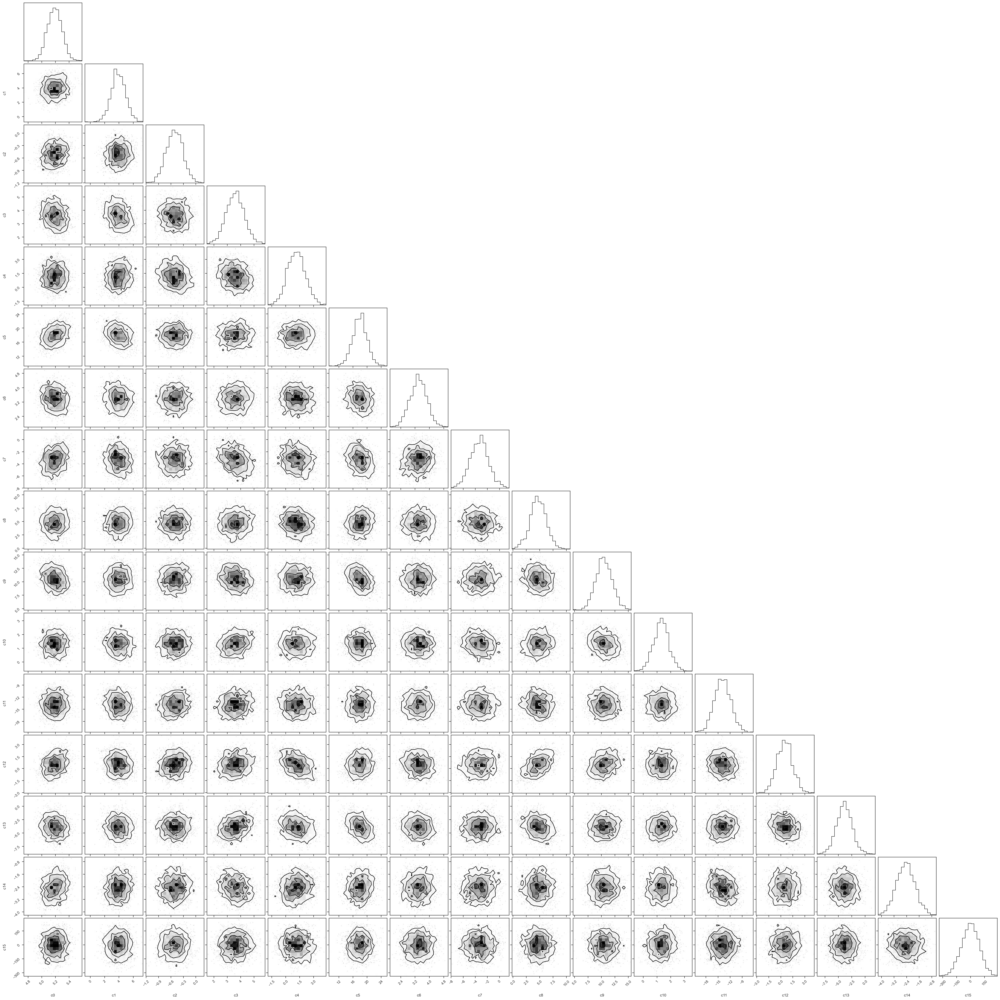

In [13]:
var_names = ["c"+str(i) for i in range(16)]

az.summary(trace, var_names=var_names)

_ = corner.corner(
    trace,
    var_names=var_names,
)

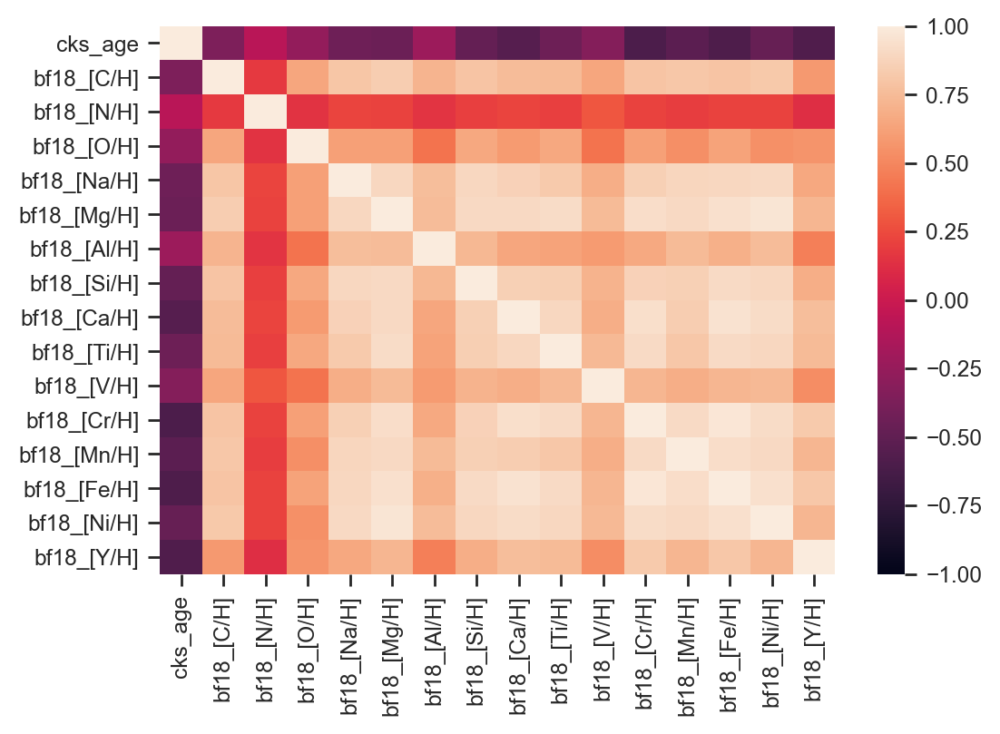

In [14]:
new_df = df[["cks_age",
             "bf18_[C/H]",
             "bf18_[N/H]",
             "bf18_[O/H]",
             "bf18_[Na/H]",
             "bf18_[Mg/H]",
             "bf18_[Al/H]",
             "bf18_[Si/H]",
             "bf18_[Ca/H]",
             "bf18_[Ti/H]",
             "bf18_[V/H]",
             "bf18_[Cr/H]",
             "bf18_[Mn/H]",
             "bf18_[Fe/H]",
             "bf18_[Ni/H]",
             "bf18_[Y/H]"]].copy()

sns.heatmap(new_df.corr(), vmin=-1, vmax=1);

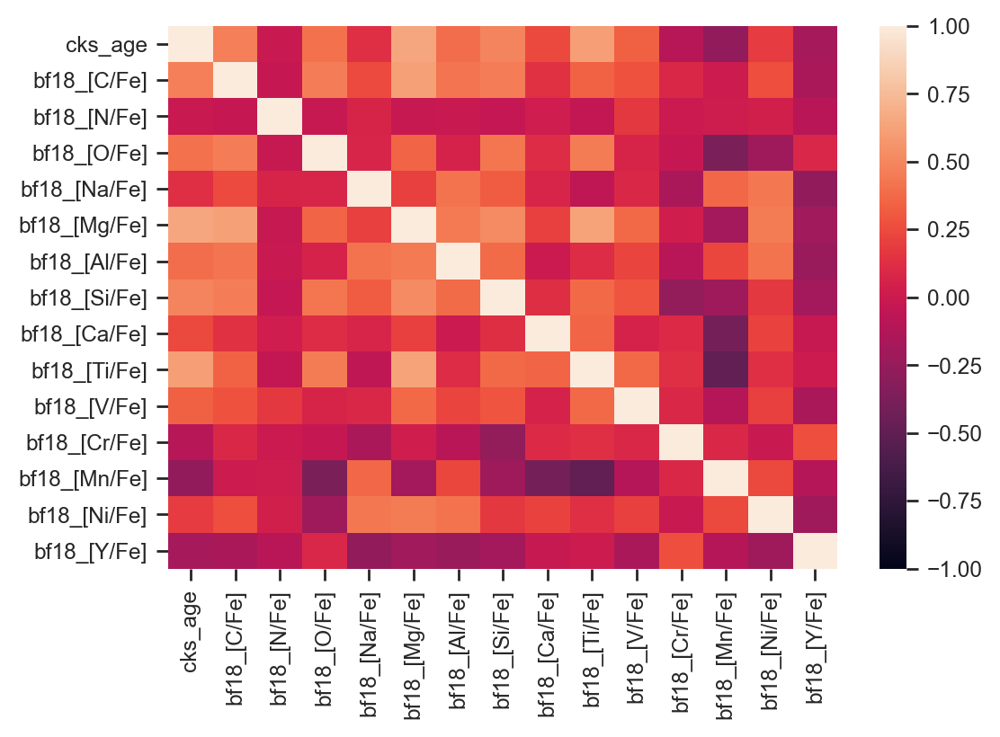

In [15]:
new_df = df[["cks_age",
             "bf18_[C/Fe]",
             "bf18_[N/Fe]",
             "bf18_[O/Fe]",
             "bf18_[Na/Fe]",
             "bf18_[Mg/Fe]",
             "bf18_[Al/Fe]",
             "bf18_[Si/Fe]",
             "bf18_[Ca/Fe]",
             "bf18_[Ti/Fe]",
             "bf18_[V/Fe]",
             "bf18_[Cr/Fe]",
             "bf18_[Mn/Fe]",
             "bf18_[Ni/Fe]",
             "bf18_[Y/Fe]"]].copy()

sns.heatmap(new_df.corr(), vmin=-1, vmax=1);

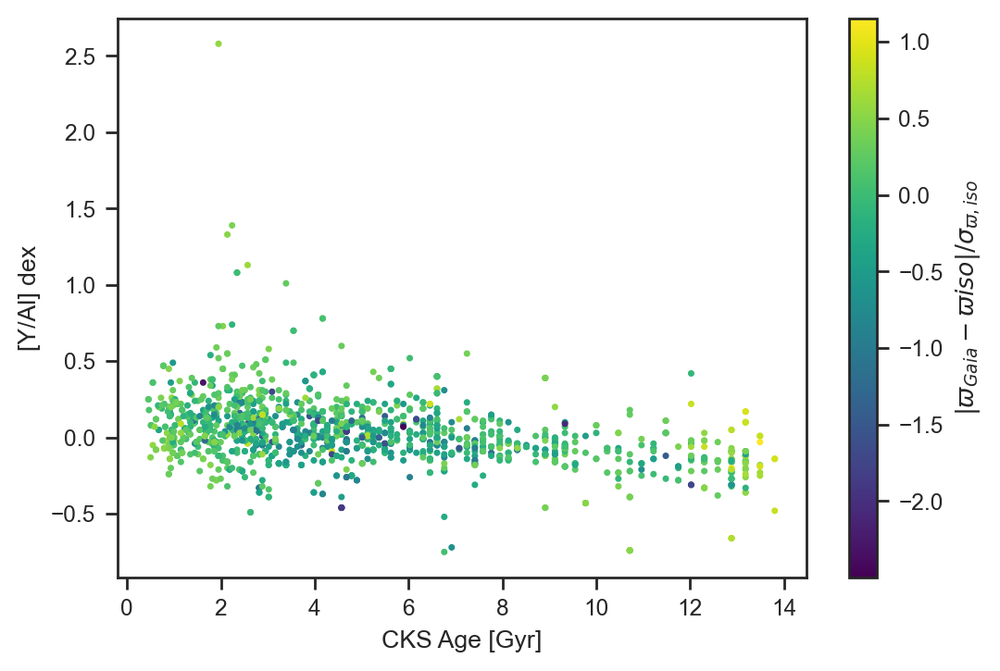

In [17]:
#Difference between Gaia parallax and 'spectroscopic' parallax
dplx = abs(df["gaia_parallax"]-df["cks_plxspec"])/df["cks_E_plxspec"]

plt.scatter(df["cks_age"], df["bf18_[Y/Al]"], c=np.log10(dplx), cmap='viridis', s=3)
plt.xlabel("CKS Age [Gyr]")
plt.ylabel("[Y/Al] dex")
plt.colorbar(label=r'$|\varpi_{Gaia} - \varpi{iso}|/\sigma_{\varpi,iso}$');

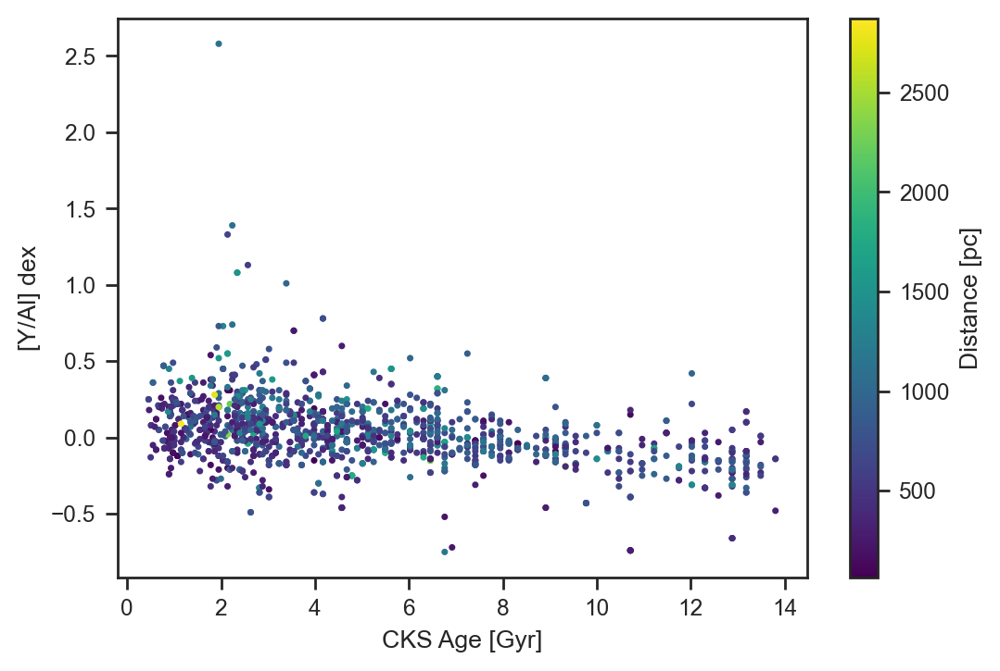

In [18]:
plt.scatter(df["cks_age"], df["bf18_[Y/Al]"], c=df['gaia_r_est'], cmap='viridis', s=3)
plt.xlabel("CKS Age [Gyr]")
plt.ylabel("[Y/Al] dex")
plt.colorbar(label='Distance [pc]');